# Assessing the impact of training image size on the final model
## 4 Runs were undertaken:
#### Run1: N 750x750 images making up a baseline training and test set. N is the total no. images in both sets
#### Run2: 4N 375x375 training and test images. These were generated by quartering the original image set
#### Run3: N 375x375 training and test images. These were generated by randomly selecting a single quartered image from run2. The aim of this run is to control for the increased number of images in Run2
#### Run4: N 256x256 training and test images. Each crop is generated from the middle of an original 750x750 image

##### All runs used the same test_images, 750*750 crops, to standardise metric evaluation. I chose the larger size to more effectively evaluate how well the models would perform on a full size image, where surrounding context of cells is important.
##### All runs used the following parameters: n_epochs = 250, learning_rate = 1e-5, weight_decay = 0.1, batch_size = 1

# Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install git+https://www.github.com/mouseland/cellpose.git

  Cloning https://www.github.com/mouseland/cellpose.git to /tmp/pip-req-build-cjii4ofc
  Running command git clone --filter=blob:none --quiet https://www.github.com/mouseland/cellpose.git /tmp/pip-req-build-cjii4ofc
  Resolved https://www.github.com/mouseland/cellpose.git to commit 94ae120369bdaea12da4921b81bc1fc7c8360558
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 109.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 28.2 MB/s eta 0:00:00
  Created wheel for cellpose: filename=cellpose-4.1.2.dev28+g94ae12036-py3-none-any.whl size=214952 sha256=b795a8b5fe0ed198c0d1cee3a4039de8d609690b7b31b3063cc9ccb50663fbc6
  Stored in directory: /tmp/pip-ephem-wheel-cache-813iknp4/wheels/df/b6/31/a3013c44290eabb46f4c06d1efb19744124fcad2d59684ec5e
Successfully built cellpose


# Run 1

## Inputting your data

In [ ]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
from tqdm import trange
import matplotlib.pyplot as plt

io.logger_setup() # run this to get printing of progress

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  raise ImportError("No GPU access, change your runtime")

model = models.CellposeModel(gpu=True)

creating new log file
[GUI INFO] : WRITING LOG OUTPUT TO /root/.cellpose/run.log

cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-04 15:55:34,302 [io INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2026-05-04 15:55:34,303 [io INFO] 
cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-04 15:55:34,782 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 15:55:34,783 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 15:55:34,784 [core INFO] >>>> using GPU (CUDA)
2026-05-04 15:55:37,268 [models INFO] Downloading: "https://huggingface.co/mouseland/cellpose-sam/resolve/main/cpsam" to /root/.cellpose/models/cpsam



100%|██████████| 1.15G/1.15G [00:03<00:00, 342MB/s]


In [ ]:
# *** change to your google drive folder path ***
train_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Training"

if not Path(train_dir).exists():
  raise FileNotFoundError("directory does not exist")

test_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing"

# *** change to your mask extension ***
masks_ext = "_masks"
# ^ assumes images from Cellpose GUI, if labels are tiffs, then "_masks.tif"

# list all files
files = [f for f in Path(train_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(files)} files in folder:")

for f in files:
  print(f.name)

test_files = [f for f in Path(test_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(test_files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(test_files)} files in folder:")

for file in test_files:
  print(file.name)

31 files in folder:
crop16_D3_F2_X900Y4021.tif
crop18_D3_F4_X11995Y2210.tif
crop24_D3_F4_X120Y2898.tif
crop25_D3_F4_X11177Y2330.tif
crop32_D3_F3_X8127Y2639.tif
crop33_D3_M3_X10804Y2134.tif
crop37_D3_F3_X8065Y2087.tif
crop39_D3_M4_X587Y1749.tif
crop15_D7_M4_X13462Y1748.tif
crop17_D7_M1_X7104Y1551.tif
crop28_D7_M4_X15989Y1782.tif
crop29_D7_M1_X4871Y1632.tif
crop30_D7_M1_X9032Y1716.tif
crop32_D7_M4_X20378Y668.tif
crop39_D7_M3_X17422Y1434.tif
crop11_D10_F2_X9113Y2842.tif
crop13_D10_M3_X1738Y1263.tif
crop14_D10_M3_X21257Y1572.tif
crop16_D10_M3_X12043Y2296.tif
crop22_D10_M4_X6162Y5072.tif
crop26_D10_M4_X5146Y6258.tif
crop35_D10_M1_X11909Y702.tif
crop37_D10_M1_X252Y2606.tif
crop8_Ctrl_F1_X20468Y612.tif
crop9_Ctrl_F1_X16265Y382.tif
crop10_Ctrl_F3_X401Y415.tif
crop15_Ctrl_F2_X7759Y288.tif
crop20_Ctrl_F3_X2334Y724.tif
crop23_Ctrl_F2_X4630Y702.tif
crop33_Ctrl_F2_X15624Y357.tif
crop35_Ctrl_F1_X11139Y769.tif
16 files in folder:
crop0_D3_F4_X13886Y1685.tif
crop5_D3_F2_X13048Y2931.tif
crop7_D3_M2_X14

In [ ]:
from cellpose import train

model_name = "Image_Size_Run1"

# default training params
n_epochs = 250
learning_rate = 1e-5
weight_decay = 0.1
batch_size = 1

# get files
output = io.load_train_test_data(train_dir, test_dir, mask_filter=masks_ext)
train_data, train_labels, _, test_data, test_labels, _ = output


new_model_path, train_losses, test_losses = train.train_seg(model.net,
                                                            train_data=train_data,
                                                            train_labels=train_labels,
                                                            test_data=test_data,
                                                            test_labels=test_labels,
                                                            batch_size=batch_size,
                                                            n_epochs=n_epochs,
                                                            learning_rate=learning_rate,
                                                            weight_decay=weight_decay,
                                                            save_every = 10,
                                                            save_each = True,
                                                            nimg_per_epoch=max(2, len(train_data)), # can change this
                                                            model_name=model_name)

2026-05-04 15:55:47,027 [io INFO] not all flows are present, running flow generation for all images
2026-05-04 15:56:24,264 [io INFO] 31 / 31 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Training folder have labels
2026-05-04 15:56:24,276 [io INFO] not all flows are present, running flow generation for all images
2026-05-04 15:56:44,475 [io INFO] 16 / 16 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing folder have labels
2026-05-04 15:56:44,476 [train INFO] >>> converting bfloat16 network to float32 for training
2026-05-04 15:56:44,489 [dynamics INFO] computing flows for labels


100%|██████████| 31/31 [00:04<00:00,  7.02it/s]

2026-05-04 15:56:48,942 [dynamics INFO] computing flows for labels



100%|██████████| 16/16 [00:01<00:00,  8.07it/s]

2026-05-04 15:56:50,947 [train INFO] >>> computing diameters



100%|██████████| 16/16 [00:00<00:00, 430.03it/s]

2026-05-04 15:56:51,066 [train INFO] >>> normalizing {'lowhigh': None, 'percentile': None, 'normalize': True, 'norm3D': True, 'sharpen_radius': 0, 'smooth_radius': 0, 'tile_norm_blocksize': 0, 'tile_norm_smooth3D': 1, 'invert': False}


2026-05-04 15:56:52,303 [train INFO] >>> n_epochs=250, n_train=31, n_test=16
2026-05-04 15:56:52,304 [train INFO] >>> AdamW, learning_rate=0.00001, weight_decay=0.10000
2026-05-04 15:56:52,306 [train INFO] >>> saving model to /content/models/Image_Size_Run1
2026-05-04 15:56:59,080 [train INFO] 0, train_loss=1.8725, test_loss=1.3808, LR=0.000000, time 6.78s
2026-05-04 15:57:21,318 [train INFO] 5, train_loss=1.3469, test_loss=1.0742, LR=0.000006, time 29.01s
2026-05-04 15:57:44,038 [train INFO] 10, train_loss=1.1335, test_loss=1.0199, LR=0.000010, time 51.73s
2026-05-04 15:57:44,038 [train INFO] saving network parameters to /content/models/Image_Size_Run1_epoch_0010
2026-05-04 15:58:29,158 [train INFO] 20, train_loss=1.0841, test_loss=0.9662, LR=0.000010, time 96.85s
2026-05-04 15:58:29,159 [train INFO] saving network parameters to /content/models/Image_Size_Run1_epoch_0020
2026-05-04 15:59:14,159 [train INFO] 30, train_loss=0.9408, test_loss=0.8915, LR=0.000010, time 141.85s
2026-05-04 

In [ ]:
#save the losses if you want - load and plot later on
import json
train_loss_list = train_losses.tolist()
test_loss_list = test_losses.tolist()

losses = {
    'train_losses': train_loss_list,
    'test_losses': test_loss_list
}

with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'w') as f:
    json.dump(losses, f)

In [ ]:
test_loss_list_full = [x for x in test_loss_list if x != 0.0]
min_test_loss = min(test_loss_list_full)
min_test_loss

best_epoch = test_loss_list.index(min_test_loss)
best_epoch

130

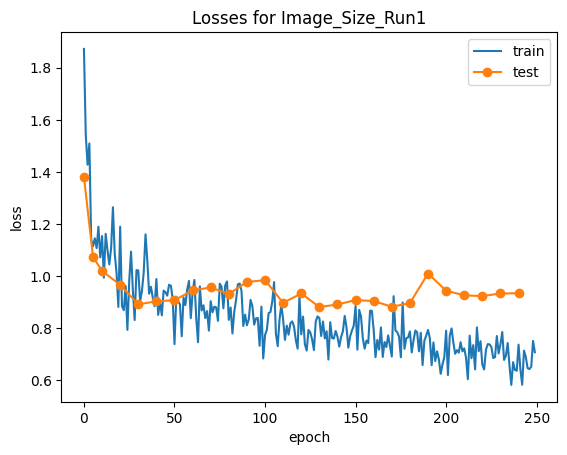

In [ ]:
# plotting the test and training losses
with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'r') as f:
    losses = json.load(f)

import matplotlib.pyplot as plt
import numpy as np

# Filter out zero values from test losses, keeping track of their epoch indices
train_epochs = range(len(train_losses))
test_epochs = [(i, v) for i, v in enumerate(test_losses) if v != 0]

if test_epochs:
    test_x, test_y = zip(*test_epochs)

plt.plot(train_epochs, train_losses, label='train')
plt.plot(test_x, test_y, label='test', marker='o')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title(f'Losses for {model_name}')
plt.show()

In [ ]:
from cellpose import metrics
import os

# point to whichever epoch you want
best_epoch = best_epoch  # whatever you decide from the loss plot
checkpoint_path = os.path.join("/content/models/", f"{model_name}_epoch_{best_epoch:04d}")
print(checkpoint_path)

model = models.CellposeModel(gpu=True,
                             pretrained_model=checkpoint_path)

model.net.save_model(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

/content/models/Image_Size_Run1_epoch_0130
2026-05-04 16:15:44,558 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 16:15:44,559 [core INFO] >>>> using GPU (CUDA)
2026-05-04 16:15:46,698 [models INFO] >>>> loading model /content/models/Image_Size_Run1_epoch_0130


In [ ]:
#delete all models from /content/models/
intermediates = os.listdir("/content/models")
for model in intermediates:
  os.remove(f"/content/models/{model}")

In [ ]:
from cellpose import metrics
import os


model = models.CellposeModel(gpu=True,
                             pretrained_model=f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

#run model on test images
masks = model.eval(test_data, batch_size=32)[0]



# check performance using ground truth labels
print(f"Model: {model_name}")
# --- Average Precision (at multiple thresholds) ---
ap, tp, fp, fn = metrics.average_precision(test_labels, masks, threshold=[0.5, 0.75, 0.9])

print('=== Average Precision ===')
for i, th in enumerate([0.5, 0.75, 0.9]):
    print(f'  AP @ IoU {th}:  {ap[:, i].mean():.3f}')
    print(f'    TP: {tp[:, i].sum():.0f}  |  FP: {fp[:, i].sum():.0f}  |  FN: {fn[:, i].sum():.0f}')

# --- Aggregated Jaccard Index ---
aji = metrics.aggregated_jaccard_index(test_labels, masks)

print('\n=== Aggregated Jaccard Index ===')
print(f'  Mean AJI: {aji.mean():.3f}')
print(f'  Std  AJI: {aji.std():.3f}')

# --- Boundary Scores (at multiple scales) ---
scales = [1.0]  # fractions of mean cell diameter
precision, recall, fscore = metrics.boundary_scores(test_labels, masks, scales)

print('\n=== Boundary Scores ===')
print(f'  Scale {scales[0]}x cell diameter:')
print(f'    Precision: {precision.mean():.3f}  |  Recall: {recall.mean():.3f}  |  F-score: {fscore.mean():.3f}')

# --- Per-image summary ---
print('\n=== Per-image breakdown ===')
print(f'  {"Image":<8} {"AP@0.5":>8} {"AP@0.75":>8} {"AP@0.9":>8} {"AJI":>8} {"F@1.0x":>8}')
print('  ' + '-' * 48)
for n in range(len(test_labels)):
    print(f'  {n:<8} {ap[n,0]:>8.3f} {ap[n,1]:>8.3f} {ap[n,2]:>8.3f} {aji[n]:>8.3f} {fscore[0,n]:>8.3f}')

2026-05-04 16:15:51,802 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 16:15:51,802 [core INFO] >>>> using GPU (CUDA)
2026-05-04 16:15:53,992 [models INFO] >>>> loading model /content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/Image_Size_Run1
2026-05-04 16:16:04,075 [utils INFO] 100%|##########| 16/16 [00:09<00:00,  1.68it/s]
Model: Image_Size_Run1
=== Average Precision ===
  AP @ IoU 0.5:  0.785
    TP: 2781  |  FP: 313  |  FN: 406
  AP @ IoU 0.75:  0.460
    TP: 1973  |  FP: 1121  |  FN: 1214
  AP @ IoU 0.9:  0.171
    TP: 919  |  FP: 2175  |  FN: 2268

=== Aggregated Jaccard Index ===
  Mean AJI: 0.768
  Std  AJI: 0.100

=== Boundary Scores ===
  Scale 1.0x cell diameter:
    Precision: 0.971  |  Recall: 0.981  |  F-score: 0.976

=== Per-image breakdown ===
  Image      AP@0.5  AP@0.75   AP@0.9      AJI   F@1.0x
  ------------------------------------------------
  0           0.696    0.240    0.047    0.682    0.986
  1           0.918    0.7

## Testing the results

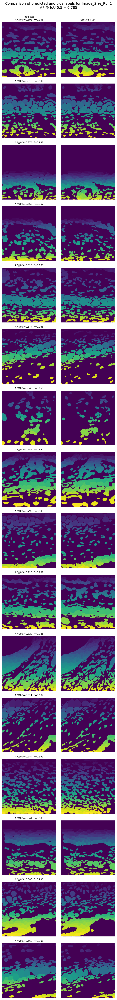

In [ ]:
import matplotlib.pyplot as plt

n = len(test_data)
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n), dpi=150)

for k, im in enumerate(test_data):
    # --- Predicted mask (left column) ---
    ax_pred = axes[k, 0]
    ax_pred.imshow(masks[k])
    ax_pred.axis('off')
    ax_pred.set_title(f'AP@0.5={ap[k,0]:.3f}  F={fscore[0,k]:.3f}', fontsize=8)

    # --- Ground truth (right column) ---
    ax_true = axes[k, 1]
    ax_true.imshow(test_labels[k])
    ax_true.axis('off')

# Column headers on the top row only
axes[0, 0].set_title(
    f'Predicted\nAP@0.5={ap[0,0]:.3f}  F={fscore[0,0]:.3f}', fontsize=8
)
axes[0, 1].set_title('Ground Truth', fontsize=8)

fig.suptitle(
    f'Comparison of predicted and true labels for {model_name}\n'
    f'AP @ IoU 0.5 = {ap[:,0].mean():.3f}',
    fontsize=12,
    y = 1.0
)
plt.tight_layout()

In [ ]:
import os
from tifffile import imwrite

# Define the output folder name (sibling to the input folder)
input_folder = "Testing"
output_folder = "Outputs"

# Save predicted masks
for k, mask in enumerate(masks):
    orig_path = test_files[k]

    # Replace the input folder name with the output folder name in the path
    out_path = orig_path.replace(f"/{input_folder}/", f"/{output_folder}/")

    # Add 'pred_' prefix to the filename
    out_dir = os.path.dirname(out_path)
    out_filename = "pred_" + os.path.basename(out_path)
    out_path = os.path.join(out_dir, out_filename)

    # Create output directory if it doesn't exist
    os.makedirs(out_dir, exist_ok=True)

    imwrite(out_path, mask.astype("uint16"))
    print(f"Saved: {out_path}")

Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop0_D3_F4_X13886Y1685_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop5_D3_F2_X13048Y2931_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop7_D3_M2_X14307Y3419_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop12_D3_F1_X21407Y1345_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop2_D7_M1_X11309Y990_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop6_D7_F1_X16433Y3122_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop9_D7_M2_X2464Y2545_pred.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing/crop13_D7_M3_X12073Y1960_p

# Run 2

## Inputting your data

In [ ]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
from tqdm import trange
import matplotlib.pyplot as plt

io.logger_setup() # run this to get printing of progress

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  raise ImportError("No GPU access, change your runtime")

model = models.CellposeModel(gpu=True)

creating new log file
[GUI INFO] : WRITING LOG OUTPUT TO /root/.cellpose/run.log

cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-04 23:45:28,726 [io INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2026-05-04 23:45:28,726 [io INFO] 
cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-04 23:45:29,205 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 23:45:29,206 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-04 23:45:29,207 [core INFO] >>>> using GPU (CUDA)
2026-05-04 23:45:31,666 [models INFO] Downloading: "https://huggingface.co/mouseland/cellpose-sam/resolve/main/cpsam" to /root/.cellpose/models/cpsam



100%|██████████| 1.15G/1.15G [00:02<00:00, 473MB/s]


In [ ]:
# *** change to your google drive folder path ***
train_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Training"

if not Path(train_dir).exists():
  raise FileNotFoundError("directory does not exist")

test_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing"
# *** change to your mask extension ***
masks_ext = "_masks"
# ^ assumes images from Cellpose GUI, if labels are tiffs, then "_masks.tif"

# list all files
files = [f for f in Path(train_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(files)} files in folder:")

for f in files:
  print(f.name)

test_files = [f for f in Path(test_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(test_files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(test_files)} files in folder:")

for file in test_files:
  print(file.name)

124 files in folder:
1_crop10_Ctrl_F3_X401Y415.tif
2_crop10_Ctrl_F3_X401Y415.tif
3_crop14_D10_M3_X21257Y1572.tif
2_crop16_D10_M3_X12043Y2296.tif
2_crop14_D10_M3_X21257Y1572.tif
4_crop10_Ctrl_F3_X401Y415.tif
3_crop13_D10_M3_X1738Y1263.tif
1_crop14_D10_M3_X21257Y1572.tif
2_crop15_Ctrl_F2_X7759Y288.tif
4_crop16_D10_M3_X12043Y2296.tif
1_crop11_D10_F2_X9113Y2842.tif
4_crop14_D10_M3_X21257Y1572.tif
4_crop13_D10_M3_X1738Y1263.tif
4_crop11_D10_F2_X9113Y2842.tif
2_crop15_D7_M4_X13462Y1748.tif
3_crop10_Ctrl_F3_X401Y415.tif
3_crop11_D10_F2_X9113Y2842.tif
4_crop15_D7_M4_X13462Y1748.tif
3_crop16_D10_M3_X12043Y2296.tif
1_crop15_Ctrl_F2_X7759Y288.tif
1_crop15_D7_M4_X13462Y1748.tif
3_crop15_D7_M4_X13462Y1748.tif
2_crop11_D10_F2_X9113Y2842.tif
2_crop13_D10_M3_X1738Y1263.tif
1_crop13_D10_M3_X1738Y1263.tif
1_crop16_D10_M3_X12043Y2296.tif
3_crop15_Ctrl_F2_X7759Y288.tif
4_crop15_Ctrl_F2_X7759Y288.tif
2_crop30_D7_M1_X9032Y1716.tif
1_crop18_D3_F4_X11995Y2210.tif
4_crop35_D10_M1_X11909Y702.tif
4_crop25_D3_F4_

In [ ]:
from cellpose import train

model_name = "Image_Size_Run2"

# default training params
n_epochs = 250
learning_rate = 1e-5
weight_decay = 0.1
batch_size = 1

# get files
output = io.load_train_test_data(train_dir, test_dir, mask_filter=masks_ext)
train_data, train_labels, _, test_data, test_labels, _ = output


new_model_path, train_losses, test_losses = train.train_seg(model.net,
                                                            train_data=train_data,
                                                            train_labels=train_labels,
                                                            test_data=test_data,
                                                            test_labels=test_labels,
                                                            batch_size=batch_size,
                                                            n_epochs=n_epochs,
                                                            learning_rate=learning_rate,
                                                            weight_decay=weight_decay,
                                                            save_every = 10,
                                                            save_each = True,
                                                            nimg_per_epoch=max(2, len(train_data)), # can change this
                                                            model_name=model_name)

2026-05-04 23:45:40,268 [io INFO] not all flows are present, running flow generation for all images
2026-05-04 23:45:54,402 [io INFO] 124 / 124 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Training folder have labels
2026-05-04 23:45:54,413 [io INFO] not all flows are present, running flow generation for all images
2026-05-04 23:46:21,674 [io INFO] 16 / 16 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing folder have labels
2026-05-04 23:46:21,676 [train INFO] >>> converting bfloat16 network to float32 for training
2026-05-04 23:46:21,689 [dynamics INFO] computing flows for labels


100%|██████████| 124/124 [00:09<00:00, 12.87it/s]

2026-05-04 23:46:31,365 [dynamics INFO] computing flows for labels



100%|██████████| 16/16 [00:01<00:00,  8.26it/s]

2026-05-04 23:46:33,323 [train INFO] >>> computing diameters



  0%|          | 0/124 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 16/16 [00:00<00:00, 429.12it/s]

2026-05-04 23:46:33,467 [train WARNING] 6 train images with number of masks less than min_train_masks (5), removing from train set
2026-05-04 23:46:33,468 [train INFO] >>> normalizing {'lowhigh': None, 'percentile': None, 'normalize': True, 'norm3D': True, 'sharpen_radius': 0, 'smooth_radius': 0, 'tile_norm_blocksize': 0, 'tile_norm_smooth3D': 1, 'invert': False}


2026-05-04 23:46:34,849 [train INFO] >>> n_epochs=250, n_train=118, n_test=16
2026-05-04 23:46:34,850 [train INFO] >>> AdamW, learning_rate=0.00001, weight_decay=0.10000
2026-05-04 23:46:34,852 [train INFO] >>> saving model to /content/models/Image_Size_Run2
2026-05-04 23:46:53,571 [train INFO] 0, train_loss=1.6227, test_loss=1.3808, LR=0.000000, time 18.72s
2026-05-04 23:48:16,319 [train INFO] 5, train_loss=1.2767, test_loss=0.9629, LR=0.000006, time 101.47s
2026-05-04 23:49:38,967 [train INFO] 10, train_loss=1.0938, test_loss=0.8900, LR=0.000010, time 184.11s
2026-05-04 23:49:38,967 [train INFO] saving network parameters to /content/models/Image_Size_Run2_epoch_0010
2026-05-04 23:52:24,133 [train INFO] 20, train_loss=0.9518, test_loss=0.9398, LR=0.000010, time 349.28s
2026-05-04 23:52:24,134 [train INFO] saving network parameters to /content/models/Image_Size_Run2_epoch_0020
2026-05-04 23:55:09,578 [train INFO] 30, train_loss=0.8522, test_loss=1.0292, LR=0.000010, time 514.73s
2026-0

In [ ]:
#save the losses if you want - load and plot later on
import json
train_loss_list = train_losses.tolist()
test_loss_list = test_losses.tolist()

losses = {
    'train_losses': train_loss_list,
    'test_losses': test_loss_list
}

with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'w') as f:
    json.dump(losses, f)

In [ ]:
test_loss_list_full = [x for x in test_loss_list if x != 0.0]
min_test_loss = min(test_loss_list_full)
min_test_loss

best_epoch = test_loss_list.index(min_test_loss)
best_epoch

10

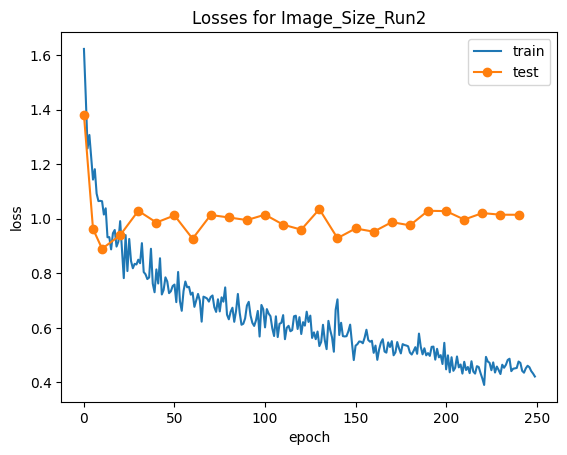

In [ ]:
# plotting the test and training losses
with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'r') as f:
    losses = json.load(f)

import matplotlib.pyplot as plt
import numpy as np

# Filter out zero values from test losses, keeping track of their epoch indices
train_epochs = range(len(train_losses))
test_epochs = [(i, v) for i, v in enumerate(test_losses) if v != 0]

if test_epochs:
    test_x, test_y = zip(*test_epochs)

plt.plot(train_epochs, train_losses, label='train')
plt.plot(test_x, test_y, label='test', marker='o')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title(f'Losses for {model_name}')
plt.show()

In [ ]:
from cellpose import metrics
import os

# point to whichever epoch you want
best_epoch = best_epoch  # whatever you decide from the loss plot
checkpoint_path = os.path.join("/content/models/", f"{model_name}_epoch_{best_epoch:04d}")
print(checkpoint_path)

model = models.CellposeModel(gpu=True,
                             pretrained_model=checkpoint_path)

model.net.save_model(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

/content/models/Image_Size_Run2_epoch_0010
2026-05-05 00:55:38,571 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 00:55:38,572 [core INFO] >>>> using GPU (CUDA)
2026-05-05 00:55:40,720 [models INFO] >>>> loading model /content/models/Image_Size_Run2_epoch_0010


In [ ]:
#delete all models from /content/models/
intermediates = os.listdir("/content/models")
for model in intermediates:
  os.remove(f"/content/models/{model}")

In [ ]:
from cellpose import metrics
import os


model = models.CellposeModel(gpu=True,
                             pretrained_model=f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

#run model on test images
masks = model.eval(test_data, batch_size=32)[0]



# check performance using ground truth labels
print(f"Model: {model_name}")
# --- Average Precision (at multiple thresholds) ---
ap, tp, fp, fn = metrics.average_precision(test_labels, masks, threshold=[0.5, 0.75, 0.9])

print('=== Average Precision ===')
for i, th in enumerate([0.5, 0.75, 0.9]):
    print(f'  AP @ IoU {th}:  {ap[:, i].mean():.3f}')
    print(f'    TP: {tp[:, i].sum():.0f}  |  FP: {fp[:, i].sum():.0f}  |  FN: {fn[:, i].sum():.0f}')

# --- Aggregated Jaccard Index ---
aji = metrics.aggregated_jaccard_index(test_labels, masks)

print('\n=== Aggregated Jaccard Index ===')
print(f'  Mean AJI: {aji.mean():.3f}')
print(f'  Std  AJI: {aji.std():.3f}')

# --- Boundary Scores (at multiple scales) ---
scales = [1.0]  # fractions of mean cell diameter
precision, recall, fscore = metrics.boundary_scores(test_labels, masks, scales)

print('\n=== Boundary Scores ===')
print(f'  Scale {scales[0]}x cell diameter:')
print(f'    Precision: {precision.mean():.3f}  |  Recall: {recall.mean():.3f}  |  F-score: {fscore.mean():.3f}')

# --- Per-image summary ---
print('\n=== Per-image breakdown ===')
print(f'  {"Image":<8} {"AP@0.5":>8} {"AP@0.75":>8} {"AP@0.9":>8} {"AJI":>8} {"F@1.0x":>8}')
print('  ' + '-' * 48)
for n in range(len(test_labels)):
    print(f'  {n:<8} {ap[n,0]:>8.3f} {ap[n,1]:>8.3f} {ap[n,2]:>8.3f} {aji[n]:>8.3f} {fscore[0,n]:>8.3f}')

2026-05-05 00:55:54,870 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 00:55:54,870 [core INFO] >>>> using GPU (CUDA)
2026-05-05 00:55:57,096 [models INFO] >>>> loading model /content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/Image_Size_Run2
2026-05-05 00:56:06,493 [utils INFO] 100%|##########| 16/16 [00:08<00:00,  1.82it/s]
Model: Image_Size_Run2
=== Average Precision ===
  AP @ IoU 0.5:  0.790
    TP: 2729  |  FP: 252  |  FN: 458
  AP @ IoU 0.75:  0.463
    TP: 1958  |  FP: 1023  |  FN: 1229
  AP @ IoU 0.9:  0.151
    TP: 808  |  FP: 2173  |  FN: 2379

=== Aggregated Jaccard Index ===
  Mean AJI: 0.764
  Std  AJI: 0.097

=== Boundary Scores ===
  Scale 1.0x cell diameter:
    Precision: 0.973  |  Recall: 0.979  |  F-score: 0.976

=== Per-image breakdown ===
  Image      AP@0.5  AP@0.75   AP@0.9      AJI   F@1.0x
  ------------------------------------------------
  0           0.684    0.231    0.032    0.663    0.983
  1           0.840    0.7

## Testing the results

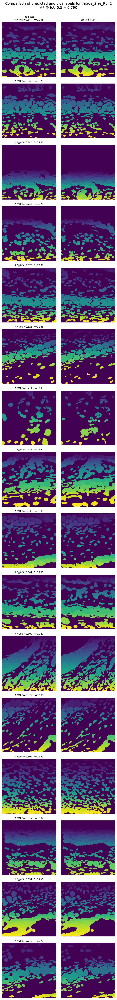

In [ ]:
import matplotlib.pyplot as plt

n = len(test_data)
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n), dpi=150)

for k, im in enumerate(test_data):
    # --- Predicted mask (left column) ---
    ax_pred = axes[k, 0]
    ax_pred.imshow(masks[k])
    ax_pred.axis('off')
    ax_pred.set_title(f'AP@0.5={ap[k,0]:.3f}  F={fscore[0,k]:.3f}', fontsize=8)

    # --- Ground truth (right column) ---
    ax_true = axes[k, 1]
    ax_true.imshow(test_labels[k])
    ax_true.axis('off')

# Column headers on the top row only
axes[0, 0].set_title(
    f'Predicted\nAP@0.5={ap[0,0]:.3f}  F={fscore[0,0]:.3f}', fontsize=8
)
axes[0, 1].set_title('Ground Truth', fontsize=8)

fig.suptitle(
    f'Comparison of predicted and true labels for {model_name}\n'
    f'AP @ IoU 0.5 = {ap[:,0].mean():.3f}',
    fontsize=12,
    y = 1.0
)
plt.tight_layout()

In [ ]:
import os
from tifffile import imwrite

# Define the output folder name
output_folder = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs"

# Save predicted masks
for k, mask in enumerate(masks):
    out_path = os.path.join(output_folder, f"pred_{k}_mask.tif")

    imwrite(out_path, mask.astype("uint16"))
    print(f"Saved: {out_path}")

Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_0_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_1_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_2_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_3_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_4_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_5_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_6_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_7_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run2/Outputs/pred_8_mask.tif
Saved: /content/dri

# Run 3

## Inputting your data

In [ ]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
from tqdm import trange
import matplotlib.pyplot as plt

io.logger_setup() # run this to get printing of progress

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  raise ImportError("No GPU access, change your runtime")

model = models.CellposeModel(gpu=True)

[GUI INFO] : WRITING LOG OUTPUT TO /root/.cellpose/run.log

cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-05 00:57:43,614 [io INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2026-05-05 00:57:43,615 [io INFO] 
cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-05 00:57:43,616 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 00:57:43,617 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 00:57:43,618 [core INFO] >>>> using GPU (CUDA)
2026-05-05 00:57:45,974 [models INFO] >>>> loading model /root/.cellpose/models/cpsam


In [ ]:
# *** change to your google drive folder path ***
train_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Training"

if not Path(train_dir).exists():
  raise FileNotFoundError("directory does not exist")

test_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing"

# *** change to your mask extension ***
masks_ext = "_masks"
# ^ assumes images from Cellpose GUI, if labels are tiffs, then "_masks.tif"

# list all files
files = [f for f in Path(train_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(files)} files in folder:")

for f in files:
  print(f.name)

test_files = [f for f in Path(test_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(test_files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(test_files)} files in folder:")

for file in test_files:
  print(file.name)

31 files in folder:
2_crop29_D7_M1_X4871Y1632.tif
1_crop37_D10_M1_X252Y2606.tif
3_crop20_Ctrl_F3_X2334Y724.tif
3_crop15_D7_M4_X13462Y1748.tif
4_crop13_D10_M3_X1738Y1263.tif
2_crop26_D10_M4_X5146Y6258.tif
4_crop17_D7_M1_X7104Y1551.tif
2_crop32_D3_F3_X8127Y2639.tif
3_crop35_D10_M1_X11909Y702.tif
2_crop18_D3_F4_X11995Y2210.tif
2_crop16_D3_F2_X900Y4021.tif
3_crop11_D10_F2_X9113Y2842.tif
3_crop15_Ctrl_F2_X7759Y288.tif
1_crop22_D10_M4_X6162Y5072.tif
3_crop25_D3_F4_X11177Y2330.tif
2_crop39_D3_M4_X587Y1749.tif
4_crop28_D7_M4_X15989Y1782.tif
4_crop35_Ctrl_F1_X11139Y769.tif
3_crop24_D3_F4_X120Y2898.tif
1_crop23_Ctrl_F2_X4630Y702.tif
1_crop8_Ctrl_F1_X20468Y612.tif
1_crop16_D10_M3_X12043Y2296.tif
1_crop10_Ctrl_F3_X401Y415.tif
3_crop39_D7_M3_X17422Y1434.tif
3_crop32_D7_M4_X20378Y668.tif
1_crop37_D3_F3_X8065Y2087.tif
4_crop14_D10_M3_X21257Y1572.tif
2_crop30_D7_M1_X9032Y1716.tif
2_crop9_Ctrl_F1_X16265Y382.tif
4_crop33_Ctrl_F2_X15624Y357.tif
3_crop33_D3_M3_X10804Y2134.tif
16 files in folder:
crop0_D3_

In [ ]:
from cellpose import train

model_name = "Image_Size_Run3"

# default training params
n_epochs = 250
learning_rate = 1e-5
weight_decay = 0.1
batch_size = 1

# get files
output = io.load_train_test_data(train_dir, test_dir, mask_filter=masks_ext)
train_data, train_labels, _, test_data, test_labels, _ = output


new_model_path, train_losses, test_losses = train.train_seg(model.net,
                                                            train_data=train_data,
                                                            train_labels=train_labels,
                                                            test_data=test_data,
                                                            test_labels=test_labels,
                                                            batch_size=batch_size,
                                                            n_epochs=n_epochs,
                                                            learning_rate=learning_rate,
                                                            weight_decay=weight_decay,
                                                            save_every = 10,
                                                            save_each = True,
                                                            nimg_per_epoch=max(2, len(train_data)), # can change this
                                                            model_name=model_name)

2026-05-05 00:57:47,037 [io INFO] not all flows are present, running flow generation for all images
2026-05-05 00:58:08,411 [io INFO] 31 / 31 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Training folder have labels
2026-05-05 00:58:08,424 [io INFO] not all flows are present, running flow generation for all images
2026-05-05 00:58:08,631 [io INFO] 16 / 16 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing folder have labels
2026-05-05 00:58:08,632 [train INFO] >>> converting bfloat16 network to float32 for training
2026-05-05 00:58:08,641 [dynamics INFO] computing flows for labels


100%|██████████| 31/31 [00:02<00:00, 11.85it/s]

2026-05-05 00:58:11,268 [dynamics INFO] computing flows for labels



100%|██████████| 16/16 [00:01<00:00,  8.24it/s]

2026-05-05 00:58:13,232 [train INFO] >>> computing diameters



100%|██████████| 16/16 [00:00<00:00, 424.81it/s]

2026-05-05 00:58:13,298 [train WARNING] 1 train images with number of masks less than min_train_masks (5), removing from train set
2026-05-05 00:58:13,299 [train INFO] >>> normalizing {'lowhigh': None, 'percentile': None, 'normalize': True, 'norm3D': True, 'sharpen_radius': 0, 'smooth_radius': 0, 'tile_norm_blocksize': 0, 'tile_norm_smooth3D': 1, 'invert': False}


2026-05-05 00:58:13,941 [train INFO] >>> n_epochs=250, n_train=30, n_test=16
2026-05-05 00:58:13,942 [train INFO] >>> AdamW, learning_rate=0.00001, weight_decay=0.10000
2026-05-05 00:58:13,944 [train INFO] >>> saving model to /content/models/Image_Size_Run3
2026-05-05 00:58:18,767 [train INFO] 0, train_loss=2.1953, test_loss=1.3808, LR=0.000000, time 4.82s
2026-05-05 00:58:39,808 [train INFO] 5, train_loss=1.4986, test_loss=1.1077, LR=0.000006, time 25.86s
2026-05-05 00:59:00,876 [train INFO] 10, train_loss=1.1540, test_loss=1.0698, LR=0.000010, time 46.93s
2026-05-05 00:59:00,876 [train INFO] saving network parameters to /content/models/Image_Size_Run3_epoch_0010
2026-05-05 00:59:43,392 [train INFO] 20, train_loss=0.9463, test_loss=1.1177, LR=0.000010, time 89.45s
2026-05-05 00:59:43,393 [train INFO] saving network parameters to /content/models/Image_Size_Run3_epoch_0020
2026-05-05 01:00:26,142 [train INFO] 30, train_loss=0.8234, test_loss=0.9636, LR=0.000010, time 132.20s
2026-05-05 

In [ ]:
#save the losses if you want - load and plot later on
import json
train_loss_list = train_losses.tolist()
test_loss_list = test_losses.tolist()

losses = {
    'train_losses': train_loss_list,
    'test_losses': test_loss_list
}

with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'w') as f:
    json.dump(losses, f)

In [ ]:
test_loss_list_full = [x for x in test_loss_list if x != 0.0]
min_test_loss = min(test_loss_list_full)
min_test_loss

best_epoch = test_loss_list.index(min_test_loss)
best_epoch

90

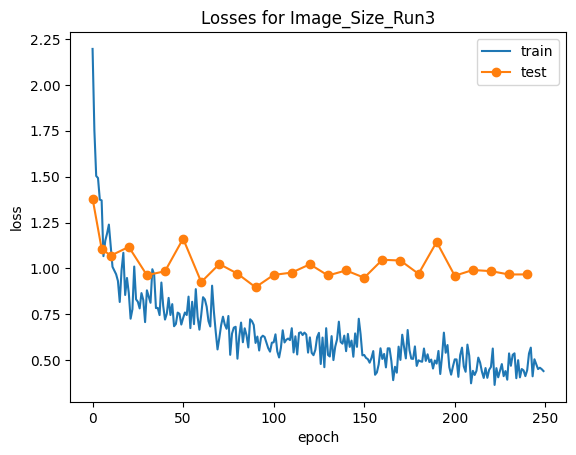

In [ ]:
# plotting the test and training losses
with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'r') as f:
    losses = json.load(f)

import matplotlib.pyplot as plt
import numpy as np

# Filter out zero values from test losses, keeping track of their epoch indices
train_epochs = range(len(train_losses))
test_epochs = [(i, v) for i, v in enumerate(test_losses) if v != 0]

if test_epochs:
    test_x, test_y = zip(*test_epochs)

plt.plot(train_epochs, train_losses, label='train')
plt.plot(test_x, test_y, label='test', marker='o')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title(f'Losses for {model_name}')
plt.show()

In [ ]:
from cellpose import metrics
import os

# point to whichever epoch you want
best_epoch = best_epoch  # whatever you decide from the loss plot
checkpoint_path = os.path.join("/content/models/", f"{model_name}_epoch_{best_epoch:04d}")
print(checkpoint_path)

model = models.CellposeModel(gpu=True,
                             pretrained_model=checkpoint_path)

model.net.save_model(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

/content/models/Image_Size_Run3_epoch_0090
2026-05-05 01:16:02,248 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:16:02,249 [core INFO] >>>> using GPU (CUDA)
2026-05-05 01:16:04,554 [models INFO] >>>> loading model /content/models/Image_Size_Run3_epoch_0090


In [ ]:
#delete all models from /content/models/
intermediates = os.listdir("/content/models")
for model in intermediates:
  os.remove(f"/content/models/{model}")

In [ ]:
from cellpose import metrics
import os


model = models.CellposeModel(gpu=True,
                             pretrained_model=f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

#run model on test images
masks = model.eval(test_data, batch_size=32)[0]



# check performance using ground truth labels
print(f"Model: {model_name}")
# --- Average Precision (at multiple thresholds) ---
ap, tp, fp, fn = metrics.average_precision(test_labels, masks, threshold=[0.5, 0.75, 0.9])

print('=== Average Precision ===')
for i, th in enumerate([0.5, 0.75, 0.9]):
    print(f'  AP @ IoU {th}:  {ap[:, i].mean():.3f}')
    print(f'    TP: {tp[:, i].sum():.0f}  |  FP: {fp[:, i].sum():.0f}  |  FN: {fn[:, i].sum():.0f}')

# --- Aggregated Jaccard Index ---
aji = metrics.aggregated_jaccard_index(test_labels, masks)

print('\n=== Aggregated Jaccard Index ===')
print(f'  Mean AJI: {aji.mean():.3f}')
print(f'  Std  AJI: {aji.std():.3f}')

# --- Boundary Scores (at multiple scales) ---
scales = [1.0]  # fractions of mean cell diameter
precision, recall, fscore = metrics.boundary_scores(test_labels, masks, scales)

print('\n=== Boundary Scores ===')
print(f'  Scale {scales[0]}x cell diameter:')
print(f'    Precision: {precision.mean():.3f}  |  Recall: {recall.mean():.3f}  |  F-score: {fscore.mean():.3f}')

# --- Per-image summary ---
print('\n=== Per-image breakdown ===')
print(f'  {"Image":<8} {"AP@0.5":>8} {"AP@0.75":>8} {"AP@0.9":>8} {"AJI":>8} {"F@1.0x":>8}')
print('  ' + '-' * 48)
for n in range(len(test_labels)):
    print(f'  {n:<8} {ap[n,0]:>8.3f} {ap[n,1]:>8.3f} {ap[n,2]:>8.3f} {aji[n]:>8.3f} {fscore[0,n]:>8.3f}')

2026-05-05 01:16:09,842 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:16:09,842 [core INFO] >>>> using GPU (CUDA)
2026-05-05 01:16:12,235 [models INFO] >>>> loading model /content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/Image_Size_Run3
2026-05-05 01:16:21,812 [utils INFO] 100%|##########| 16/16 [00:08<00:00,  1.81it/s]
Model: Image_Size_Run3
=== Average Precision ===
  AP @ IoU 0.5:  0.774
    TP: 2733  |  FP: 335  |  FN: 454
  AP @ IoU 0.75:  0.458
    TP: 1927  |  FP: 1141  |  FN: 1260
  AP @ IoU 0.9:  0.179
    TP: 898  |  FP: 2170  |  FN: 2289

=== Aggregated Jaccard Index ===
  Mean AJI: 0.770
  Std  AJI: 0.083

=== Boundary Scores ===
  Scale 1.0x cell diameter:
    Precision: 0.978  |  Recall: 0.981  |  F-score: 0.979

=== Per-image breakdown ===
  Image      AP@0.5  AP@0.75   AP@0.9      AJI   F@1.0x
  ------------------------------------------------
  0           0.646    0.192    0.031    0.650    0.982
  1           0.840    0.7

## Testing the results

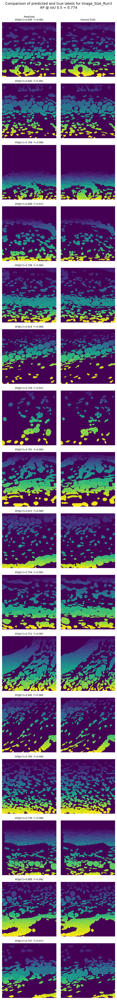

In [ ]:
import matplotlib.pyplot as plt

n = len(test_data)
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n), dpi=150)

for k, im in enumerate(test_data):
    # --- Predicted mask (left column) ---
    ax_pred = axes[k, 0]
    ax_pred.imshow(masks[k])
    ax_pred.axis('off')
    ax_pred.set_title(f'AP@0.5={ap[k,0]:.3f}  F={fscore[0,k]:.3f}', fontsize=8)

    # --- Ground truth (right column) ---
    ax_true = axes[k, 1]
    ax_true.imshow(test_labels[k])
    ax_true.axis('off')

# Column headers on the top row only
axes[0, 0].set_title(
    f'Predicted\nAP@0.5={ap[0,0]:.3f}  F={fscore[0,0]:.3f}', fontsize=8
)
axes[0, 1].set_title('Ground Truth', fontsize=8)

fig.suptitle(
    f'Comparison of predicted and true labels for {model_name}\n'
    f'AP @ IoU 0.5 = {ap[:,0].mean():.3f}',
    fontsize=12,
    y = 1.0
)
plt.tight_layout()

In [ ]:
import os
from tifffile import imwrite

# Define the output folder name
output_folder = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs"

# Save predicted masks
for k, mask in enumerate(masks):
    out_path = os.path.join(output_folder, f"pred_{k}_mask.tif")

    imwrite(out_path, mask.astype("uint16"))
    print(f"Saved: {out_path}")

Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_0_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_1_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_2_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_3_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_4_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_5_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_6_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_7_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run3/Outputs/pred_8_mask.tif
Saved: /content/dri

# Run 4

## Inputting your data

In [ ]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
from tqdm import trange
import matplotlib.pyplot as plt

io.logger_setup() # run this to get printing of progress

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  raise ImportError("No GPU access, change your runtime")

model = models.CellposeModel(gpu=True)

[GUI INFO] : WRITING LOG OUTPUT TO /root/.cellpose/run.log

cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-05 01:17:59,669 [io INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2026-05-05 01:17:59,670 [io INFO] 
cellpose version: 	4.1.2.dev28+g94ae12036 
platform:       	linux 
python version: 	3.12.13 
torch version:  	2.10.0+cu128
2026-05-05 01:17:59,672 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:17:59,673 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:17:59,673 [core INFO] >>>> using GPU (CUDA)
2026-05-05 01:18:02,037 [models INFO] >>>> loading model /root/.cellpose/models/cpsam


In [ ]:
# *** change to your google drive folder path ***
train_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Training"

if not Path(train_dir).exists():
  raise FileNotFoundError("directory does not exist")

test_dir = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing"

# *** change to your mask extension ***
masks_ext = "_masks"
# ^ assumes images from Cellpose GUI, if labels are tiffs, then "_masks.tif"

# list all files
files = [f for f in Path(train_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(files)} files in folder:")

for f in files:
  print(f.name)

test_files = [f for f in Path(test_dir).glob("*") if "_masks" not in f.name and "_flows" not in f.name and "_seg" not in f.name]

if(len(test_files)==0):
  raise FileNotFoundError("no files found, did you specify the correct folder and extension?")
else:
  print(f"{len(test_files)} files in folder:")

for file in test_files:
  print(file.name)

31 files in folder:
256_crop16_D10_M3_X12043Y2296.tif
256_crop11_D10_F2_X9113Y2842.tif
256_crop14_D10_M3_X21257Y1572.tif
256_crop15_D7_M4_X13462Y1748.tif
256_crop15_Ctrl_F2_X7759Y288.tif
256_crop17_D7_M1_X7104Y1551.tif
256_crop13_D10_M3_X1738Y1263.tif
256_crop16_D3_F2_X900Y4021.tif
256_crop10_Ctrl_F3_X401Y415.tif
256_crop20_Ctrl_F3_X2334Y724.tif
256_crop30_D7_M1_X9032Y1716.tif
256_crop25_D3_F4_X11177Y2330.tif
256_crop22_D10_M4_X6162Y5072.tif
256_crop35_Ctrl_F1_X11139Y769.tif
256_crop33_D3_M3_X10804Y2134.tif
256_crop35_D10_M1_X11909Y702.tif
256_crop37_D3_F3_X8065Y2087.tif
256_crop33_Ctrl_F2_X15624Y357.tif
256_crop39_D7_M3_X17422Y1434.tif
256_crop32_D7_M4_X20378Y668.tif
256_crop39_D3_M4_X587Y1749.tif
256_crop26_D10_M4_X5146Y6258.tif
256_crop18_D3_F4_X11995Y2210.tif
256_crop9_Ctrl_F1_X16265Y382.tif
256_crop28_D7_M4_X15989Y1782.tif
256_crop37_D10_M1_X252Y2606.tif
256_crop8_Ctrl_F1_X20468Y612.tif
256_crop24_D3_F4_X120Y2898.tif
256_crop29_D7_M1_X4871Y1632.tif
256_crop23_Ctrl_F2_X4630Y702.tif

In [ ]:
from cellpose import train

model_name = "Image_Size_Run4"

# default training params
n_epochs = 250
learning_rate = 1e-5
weight_decay = 0.1
batch_size = 1

# get files
output = io.load_train_test_data(train_dir, test_dir, mask_filter=masks_ext)
train_data, train_labels, _, test_data, test_labels, _ = output


new_model_path, train_losses, test_losses = train.train_seg(model.net,
                                                            train_data=train_data,
                                                            train_labels=train_labels,
                                                            test_data=test_data,
                                                            test_labels=test_labels,
                                                            batch_size=batch_size,
                                                            n_epochs=n_epochs,
                                                            learning_rate=learning_rate,
                                                            weight_decay=weight_decay,
                                                            save_every = 10,
                                                            save_each = True,
                                                            nimg_per_epoch=max(2, len(train_data)), # can change this
                                                            model_name=model_name)

2026-05-05 01:18:03,017 [io INFO] not all flows are present, running flow generation for all images
2026-05-05 01:18:28,316 [io INFO] 31 / 31 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Training folder have labels
2026-05-05 01:18:28,328 [io INFO] not all flows are present, running flow generation for all images
2026-05-05 01:18:28,540 [io INFO] 16 / 16 images in /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run1/Testing folder have labels
2026-05-05 01:18:28,541 [train INFO] >>> converting bfloat16 network to float32 for training
2026-05-05 01:18:28,550 [dynamics INFO] computing flows for labels


100%|██████████| 31/31 [00:02<00:00, 15.43it/s]

2026-05-05 01:18:30,566 [dynamics INFO] computing flows for labels



100%|██████████| 16/16 [00:01<00:00,  8.17it/s]

2026-05-05 01:18:32,544 [train INFO] >>> computing diameters



100%|██████████| 16/16 [00:00<00:00, 398.75it/s]

2026-05-05 01:18:32,607 [train WARNING] 3 train images with number of masks less than min_train_masks (5), removing from train set
2026-05-05 01:18:32,607 [train INFO] >>> normalizing {'lowhigh': None, 'percentile': None, 'normalize': True, 'norm3D': True, 'sharpen_radius': 0, 'smooth_radius': 0, 'tile_norm_blocksize': 0, 'tile_norm_smooth3D': 1, 'invert': False}


2026-05-05 01:18:33,134 [train INFO] >>> n_epochs=250, n_train=28, n_test=16
2026-05-05 01:18:33,135 [train INFO] >>> AdamW, learning_rate=0.00001, weight_decay=0.10000
2026-05-05 01:18:33,137 [train INFO] >>> saving model to /content/models/Image_Size_Run4
2026-05-05 01:18:37,931 [train INFO] 0, train_loss=1.9920, test_loss=1.3808, LR=0.000000, time 4.79s
2026-05-05 01:18:58,778 [train INFO] 5, train_loss=1.4532, test_loss=1.0777, LR=0.000006, time 25.64s
2026-05-05 01:19:19,535 [train INFO] 10, train_loss=0.9604, test_loss=1.0832, LR=0.000010, time 46.40s
2026-05-05 01:19:19,535 [train INFO] saving network parameters to /content/models/Image_Size_Run4_epoch_0010
2026-05-05 01:20:02,093 [train INFO] 20, train_loss=0.8351, test_loss=1.1065, LR=0.000010, time 88.96s
2026-05-05 01:20:02,094 [train INFO] saving network parameters to /content/models/Image_Size_Run4_epoch_0020
2026-05-05 01:20:44,368 [train INFO] 30, train_loss=0.7299, test_loss=0.9884, LR=0.000010, time 131.23s
2026-05-05 

In [ ]:
#save the losses if you want - load and plot later on
import json
train_loss_list = train_losses.tolist()
test_loss_list = test_losses.tolist()

losses = {
    'train_losses': train_loss_list,
    'test_losses': test_loss_list
}

with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'w') as f:
    json.dump(losses, f)

In [ ]:
test_loss_list_full = [x for x in test_loss_list if x != 0.0]
min_test_loss = min(test_loss_list_full)
min_test_loss

best_epoch = test_loss_list.index(min_test_loss)
best_epoch

30

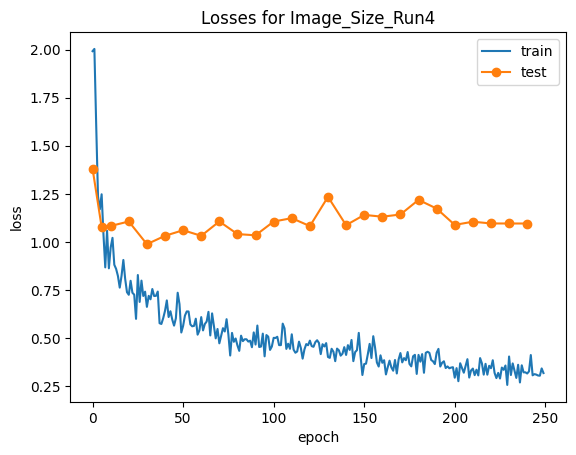

In [ ]:
# plotting the test and training losses
with open(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}_losses.json", 'r') as f:
    losses = json.load(f)

import matplotlib.pyplot as plt
import numpy as np

# Filter out zero values from test losses, keeping track of their epoch indices
train_epochs = range(len(train_losses))
test_epochs = [(i, v) for i, v in enumerate(test_losses) if v != 0]

if test_epochs:
    test_x, test_y = zip(*test_epochs)

plt.plot(train_epochs, train_losses, label='train')
plt.plot(test_x, test_y, label='test', marker='o')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title(f'Losses for {model_name}')
plt.show()

In [ ]:
from cellpose import metrics
import os

# point to whichever epoch you want
best_epoch = best_epoch  # whatever you decide from the loss plot
checkpoint_path = os.path.join("/content/models/", f"{model_name}_epoch_{best_epoch:04d}")
print(checkpoint_path)

model = models.CellposeModel(gpu=True,
                             pretrained_model=checkpoint_path)

model.net.save_model(f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

/content/models/Image_Size_Run4_epoch_0030
2026-05-05 01:36:17,110 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:36:17,110 [core INFO] >>>> using GPU (CUDA)
2026-05-05 01:36:19,436 [models INFO] >>>> loading model /content/models/Image_Size_Run4_epoch_0030


In [ ]:
#delete all models from /content/models/
intermediates = os.listdir("/content/models")
for model in intermediates:
  os.remove(f"/content/models/{model}")

In [ ]:
from cellpose import metrics
import os


model = models.CellposeModel(gpu=True,
                             pretrained_model=f"/content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/{model_name}")

#run model on test images
masks = model.eval(test_data, batch_size=32)[0]



# check performance using ground truth labels
print(f"Model: {model_name}")
# --- Average Precision (at multiple thresholds) ---
ap, tp, fp, fn = metrics.average_precision(test_labels, masks, threshold=[0.5, 0.75, 0.9])

print('=== Average Precision ===')
for i, th in enumerate([0.5, 0.75, 0.9]):
    print(f'  AP @ IoU {th}:  {ap[:, i].mean():.3f}')
    print(f'    TP: {tp[:, i].sum():.0f}  |  FP: {fp[:, i].sum():.0f}  |  FN: {fn[:, i].sum():.0f}')

# --- Aggregated Jaccard Index ---
aji = metrics.aggregated_jaccard_index(test_labels, masks)

print('\n=== Aggregated Jaccard Index ===')
print(f'  Mean AJI: {aji.mean():.3f}')
print(f'  Std  AJI: {aji.std():.3f}')

# --- Boundary Scores (at multiple scales) ---
scales = [1.0]  # fractions of mean cell diameter
precision, recall, fscore = metrics.boundary_scores(test_labels, masks, scales)

print('\n=== Boundary Scores ===')
print(f'  Scale {scales[0]}x cell diameter:')
print(f'    Precision: {precision.mean():.3f}  |  Recall: {recall.mean():.3f}  |  F-score: {fscore.mean():.3f}')

# --- Per-image summary ---
print('\n=== Per-image breakdown ===')
print(f'  {"Image":<8} {"AP@0.5":>8} {"AP@0.75":>8} {"AP@0.9":>8} {"AJI":>8} {"F@1.0x":>8}')
print('  ' + '-' * 48)
for n in range(len(test_labels)):
    print(f'  {n:<8} {ap[n,0]:>8.3f} {ap[n,1]:>8.3f} {ap[n,2]:>8.3f} {aji[n]:>8.3f} {fscore[0,n]:>8.3f}')

2026-05-05 01:36:24,766 [core INFO] ** TORCH CUDA version installed and working. **
2026-05-05 01:36:24,766 [core INFO] >>>> using GPU (CUDA)
2026-05-05 01:36:27,169 [models INFO] >>>> loading model /content/drive/MyDrive/Cellpose Stuff/Cross-Section Models + Losses/Image_Size_Run4
2026-05-05 01:36:36,352 [utils INFO] 100%|##########| 16/16 [00:08<00:00,  1.89it/s]
Model: Image_Size_Run4
=== Average Precision ===
  AP @ IoU 0.5:  0.742
    TP: 2714  |  FP: 403  |  FN: 473
  AP @ IoU 0.75:  0.402
    TP: 1803  |  FP: 1314  |  FN: 1384
  AP @ IoU 0.9:  0.102
    TP: 572  |  FP: 2545  |  FN: 2615

=== Aggregated Jaccard Index ===
  Mean AJI: 0.730
  Std  AJI: 0.096

=== Boundary Scores ===
  Scale 1.0x cell diameter:
    Precision: 0.965  |  Recall: 0.979  |  F-score: 0.972

=== Per-image breakdown ===
  Image      AP@0.5  AP@0.75   AP@0.9      AJI   F@1.0x
  ------------------------------------------------
  0           0.663    0.273    0.022    0.662    0.981
  1           0.828    0.6

## Testing the results

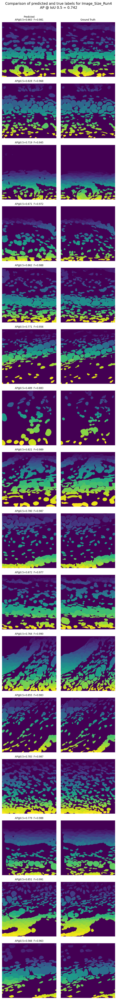

In [ ]:
import matplotlib.pyplot as plt

n = len(test_data)
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n), dpi=150)

for k, im in enumerate(test_data):
    # --- Predicted mask (left column) ---
    ax_pred = axes[k, 0]
    ax_pred.imshow(masks[k])
    ax_pred.axis('off')
    ax_pred.set_title(f'AP@0.5={ap[k,0]:.3f}  F={fscore[0,k]:.3f}', fontsize=8)

    # --- Ground truth (right column) ---
    ax_true = axes[k, 1]
    ax_true.imshow(test_labels[k])
    ax_true.axis('off')

# Column headers on the top row only
axes[0, 0].set_title(
    f'Predicted\nAP@0.5={ap[0,0]:.3f}  F={fscore[0,0]:.3f}', fontsize=8
)
axes[0, 1].set_title('Ground Truth', fontsize=8)

fig.suptitle(
    f'Comparison of predicted and true labels for {model_name}\n'
    f'AP @ IoU 0.5 = {ap[:,0].mean():.3f}',
    fontsize=12,
    y = 1.0
)
plt.tight_layout()

In [ ]:
import os
from tifffile import imwrite

# Define the output folder name
output_folder = "/content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs"

# Save predicted masks
for k, mask in enumerate(masks):
    out_path = os.path.join(output_folder, f"pred_{k}_mask.tif")

    imwrite(out_path, mask.astype("uint16"))
    print(f"Saved: {out_path}")

Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_0_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_1_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_2_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_3_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_4_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_5_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_6_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_7_mask.tif
Saved: /content/drive/MyDrive/Cellpose Stuff/Training images - Round2/Size_Test/Run4/Outputs/pred_8_mask.tif
Saved: /content/dri